In [1]:
%env NUMBA_CUDA_LOW_OCCUPANCY_WARNINGS=0
import torch
import taichi as ti
import numba.cuda as cu
import matplotlib.pyplot as plt
import math
import pandas as pd

ti.init(arch=ti.cuda)

env: NUMBA_CUDA_LOW_OCCUPANCY_WARNINGS=0
[Taichi] version 1.2.1, llvm 10.0.0, commit 12ab828a, win, python 3.10.7
[Taichi] Starting on arch=cuda


Reference:

* [Particle-based fluid simulation for interactive applications](https://dl.acm.org/doi/10.5555/846276.846298)
	* This is the paper, which simulates 3d SPH.
* [Nvidia warp's SPH example](https://github.com/NVIDIA/warp/blob/main/examples/example_sph.py)
	* This implements the paper.

Note: I didn't reach a reasonable result...


## Equations
Fluid Equation(incompressible, viscid):

$$
\left\{
	\begin{aligned}
	\frac{dv}{dt} &= 
	-\frac{1}{\rho}\nabla p + \frac{\mu}{\rho}\nabla^2 v + b \\

	\frac{d\rho}{dt} &+ \rho \nabla \cdot v = 0 \\
	\end{aligned}
\right.
$$

Ignore the second equation(conservation of mass).

Equation of State:

$$
p = k(\rho - \rho_0)
$$

In [2]:
def cal_p(kappa, rho, rho_0):
	return kappa * (rho - rho_0)

Final Equation to solve:

$$
\left\{
	\begin{aligned}
	\frac{dv}{dt} &= 
	-\frac{1}{\rho}\nabla p + \frac{\mu}{\rho}\nabla^2 v + b \\

	p &= k(\rho - \rho_0) \\
	\end{aligned}
\right.
$$

## Time Discretization
Use [explicit euler](https://en.wikipedia.org/wiki/Euler_method) to solve the ODE for $v$:

$$
\frac{dv}{dt} \approx = \frac{v|_{t+1} - v|_t}{\Delta t} 
= a|_t 
= -\frac{1}{\rho|_t}(\nabla p)|_t + \frac{\mu}{\rho|_t}(\nabla^2 v)|_t + b|_t
$$

In [3]:
def v_explicit_euler(v, dt, a):
	return v + dt * a

In [4]:
def cal_a(grad_p, rho, mu, lap_v, b):
	rho = rho.view((rho.shape[0], 1))
	return - grad_p / rho  + mu / rho * lap_v + b

Use [implicit euler](https://en.wikipedia.org/wiki/Backward_Euler_method) to solve the ODE for $x$:

$$
\frac{dx}{dt} \approx = \frac{x|_{t+1} - x|_t}{\Delta t} = v|_{t+1}
$$

In [5]:
def x_implicit_euler(x, dt, v):
	return x + dt * v

## Spatial Discretization
Use kernel approximation to estimate partial differentials.

#### Density $\rho$
The kernel function of $\rho$ :

$$
W^\rho(\delta) = \frac{4}{\pi h^8} \left\{
\begin{aligned}
	&(h^2 - \delta^2)^3 &, 0 \leq \delta \leq h \\
	&0                  &, \text{otherwise}
\end{aligned}
\right.
$$

In [6]:
@ti.func
def cal_W_rho_2d(delta, h):
	res = 0.0
	if delta >= 0 and delta <= h:
		sigma = 4.0 / (math.pi 
			# 素晴らしい h^8
			* h * h * h * h 
			* h * h * h * h
		)
		res = h*h - delta*delta
		res = res * res * res
		res = sigma * res
	return res

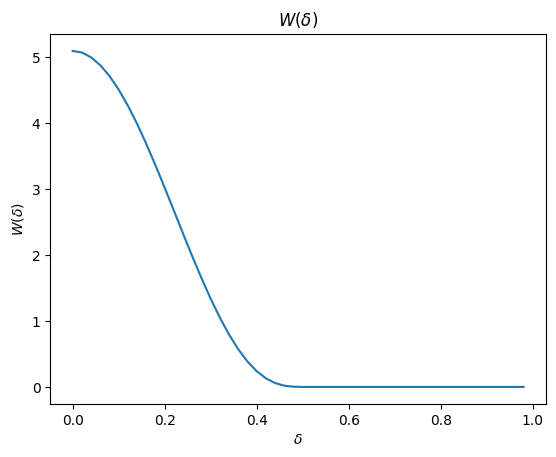

In [7]:
def test_W_rho_2d():
	h = 0.5
	delta = torch.arange(0, 2*h, 2*h/50).cuda()
	W = torch.empty_like(delta)

	@ti.kernel
	def kernel_test(W: ti.types.ndarray(), delta: ti.types.ndarray(), h: float):
		for i in range(delta.shape[0]):
			W[i] = cal_W_rho_2d(delta[i], h)
	kernel_test(W, delta, h)

	plt.plot(delta.cpu().numpy(), W.cpu().numpy())
	plt.title(r"$W(\delta)$")
	plt.xlabel(r"$\delta$")
	plt.ylabel(r"$W(\delta)$")
	plt.show()

test_W_rho_2d()

Density's kernel estimation:

$$
\rho_i \approx \sum_{j} m_j W^\rho(|x_i - x_j|)
$$

In [8]:
@ti.kernel
def kernel_cal_rho(
	rho: ti.types.ndarray(),
	m: ti.types.ndarray(),
	x: ti.types.ndarray(),
	h: float,
):
	for k in range(rho.shape[0] * rho.shape[0]):
		i = int(k / rho.shape[0])
		j = k % rho.shape[0]

		xi = ti.Vector([x[i, 0], x[i, 1]])
		xj = ti.Vector([x[j, 0], x[j, 1]])
		
		delta = ti.math.length(xi - xj)

		W = cal_W_rho_2d(delta, h)
		rho[i] += m[j] * W


def cal_rho(m, x, h):
	rho = torch.zeros((x.shape[0]))
	kernel_cal_rho(rho, m, x, h)
	return rho

In [9]:
def test_cal_rho():
	m = torch.ones(2)
	x = torch.randn((2,2))
	h = 4.0
	rho = cal_rho(m, x, h)
	print(rho)
test_cal_rho()

tensor([0.0863, 0.0863])


#### $\nabla p$

The kernel function of $\nabla p$ :

$$
W^p(\delta) = \frac{10}{\pi h^5} \left\{
\begin{aligned}
	&(h-\delta)^3 &, 0 \leq \delta \leq h \\
	&0                  &, \text{otherwise}
\end{aligned}
\right.
$$

And its derivative:

$$
\frac{\partial W^p(\delta)}{\partial \delta}
=
- \frac{30}{\pi h^5}
\left\{
\begin{aligned}
	& (h-\delta)^2 &, 0 \leq \delta \leq h \\
	&0                  &, \text{otherwise}
\end{aligned}
\right.
$$

In [10]:
@ti.func
def cal_grad_W_p_2d(delta, h):
	res = 0.0
	if delta >= 0 and delta <= h:
		sigma = 30 / (math.pi 
			# 素晴らしい h^5
			* h * h 
			* h * h * h
		)
		res = h - delta
		res = res * res
		res = - sigma * res
	return res

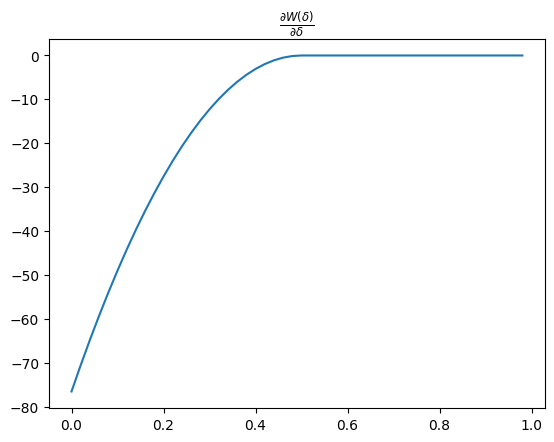

In [11]:
def test_grad_W_p_2d():
	h = 0.5
	delta = torch.arange(0, 2*h, 2*h/50).cuda()
	W = torch.empty_like(delta)

	@ti.kernel
	def kernel_test(W: ti.types.ndarray(), delta: ti.types.ndarray(), h: float):
		for i in range(delta.shape[0]):
			W[i] = cal_grad_W_p_2d(delta[i], h)
	kernel_test(W, delta, h)

	plt.plot(delta.cpu().numpy(), W.cpu().numpy())
	plt.title(r"$\frac{\partial W(\delta)}{\partial \delta}$")
	plt.show()

test_grad_W_p_2d()

The kernel estimation of $\nabla p$ :

$$
\begin{aligned}
	(\nabla p)_i 

	&\approx \sum_{j\neq i} m_j \frac{p_i+p_j}{2\rho_j} 
	\frac{\partial W^p(|x_i - x_j|)}{\partial x_i}
	\\

	&= \sum_{j\neq i} m_j \frac{p_i+p_j}{2\rho_j} 
	\frac{x_i - x_j}{|x_i - x_j|}
	\frac{\partial W^p(|x_i - x_j|)}{\partial |x_i - x_j|}
\end{aligned}
$$

In [12]:
@ti.kernel
def kernel_cal_grad_p(
	grad_p: ti.types.ndarray(), 
	p: ti.types.ndarray(), 
	m: ti.types.ndarray(),
	rho: ti.types.ndarray(), 
	x: ti.types.ndarray(),
	h: float,
):
	for k in range(p.shape[0] * p.shape[0]):
		i = int(k / p.shape[0])
		j = k % p.shape[0]
		if i != j:
			xi = ti.Vector([x[i, 0], x[i, 1]])
			xj = ti.Vector([x[j, 0], x[j, 1]])

			xij = xi - xj
			delta = ti.math.length(xij)

			# diff delta
			diff_delta = xij / max(delta, h/10000.0)
			res = diff_delta

			# m
			res *= m[j]

			# p, rho
			p_rho = (p[i] + p[j])/2.0/rho[j]
			res *= p_rho

			# diff W
			diff_W = cal_grad_W_p_2d(delta, h)
			res *= diff_W

			# pass back
			grad_p[i, 0] += res[0]
			grad_p[i, 1] += res[1]
		
def cal_grad_p(p, m, rho, x, h):
	grad_p = torch.zeros((p.shape[0], 2))
	kernel_cal_grad_p(
		grad_p, p, m, rho, x, h
	)
	return grad_p


In [13]:
def test_cal_grad_p():
	with torch.cuda.device(0):
		p = torch.ones(2)
		m = torch.ones(2)
		rho = torch.ones(2)
		x = torch.randn((2,2))
		h = 5.0
		grad_p = cal_grad_p(p, m, rho, x, h)
		print(f"x = {x.cpu().numpy()}")
		print(f"grad_p = {grad_p.cpu().numpy()}")
test_cal_grad_p()

x = [[-1.5096897  1.073141 ]
 [-1.8795937  1.3041338]]
grad_p = [[-0.05398734  0.0337133 ]
 [ 0.05398734 -0.0337133 ]]


#### $\nabla^2 v$



The kernel function of $\nabla^2 v$ :

$$
W^v(\delta) = \frac{10}{3\pi h^2}
\left\{
\begin{aligned}
	& -\frac{\delta^3}{2h^3} + \frac{\delta^2}{h^2} + \frac{h}{2r} - 1 &, 0 \leq \delta \leq h \\
	&0                  &, \text{otherwise}
\end{aligned}
\right.
$$

And its 1st, 2nd derivatives (ignore the condition for $\delta > h$):

$$
W' = \frac{\partial W^v(\delta)}{\partial \delta} = \frac{10}{3\pi h^2}
\left(
-\frac{3\delta^2}{2h^3} + \frac{2\delta}{h^2} - \frac{h}{2\delta^2}
\right)
$$

$$
W'' = \frac{\partial^2 W^v(\delta)}{\partial \delta^2} 
= \frac{10}{3\pi h^2}
\left(
-\frac{3\delta}{h^3} + \frac{2}{h^2} + \frac{h}{\delta^3}
\right)
$$

For ($e_k = [\dots, 0, 1, 0, \dots]$, only the k-th element is $1$)
$$
\begin{aligned}
\nabla^2 W 
&= \frac{\partial (\nabla W)}{\partial x_i} \cdot \sum_k e_k \\
&= \frac{\partial (\frac{\partial W(x_i - x_j)}{\partial x_i})}{\partial x_i} \cdot \sum_k e_k \\
\end{aligned}
$$

We have (see the proof in next section):

$$
\nabla^2 W = W'' + \frac{d-1}{\delta}W'
$$

where $d$ is the dim of $x_i$.
Here $d=2$.

So

$$
\nabla^2 W^v = 
\frac{10}{3\pi h^2}
\left\{
\begin{aligned}
& -\frac{9\delta}{2h^3} + \frac{4}{h^2} + \frac{h}{2\delta^3} &, 0 \leq \delta \leq h \\
& 0 &, \text{otherwise} \\
\end{aligned}
\right.
$$

Currently, we just use a simplied version which is linear to $r$...

$$
\nabla^2 W^v = 
\frac{10}{3\pi h^2}
\left\{
\begin{aligned}
& 6 \frac{h-\delta}{h^3} &, 0 \leq \delta \leq h \\
& 0 &, \text{otherwise} \\
\end{aligned}
\right.
$$

In [14]:
@ti.func
def cal_lap_W_v_2d(delta, h):
	res = 0.0
	if delta >= 0 and delta <= h:
		sigma = 10 / ( 3 * math.pi 
			# 素晴らしい h^2
			* h * h 
		)
		# res = - (9 * delta) / (2 * h * h * h)
		# res += 4 / (h * h)
		# res += h / (2 * delta * delta * delta)
		res = 6 * (h-delta) / (h * h * h)
		res *= sigma
	return res

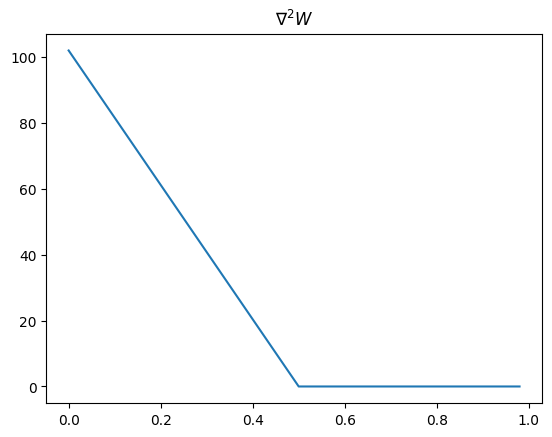

In [15]:
def test_lap_W_v_2d():
	h = 0.5
	delta = torch.arange(0, 2*h, 2*h/50).cuda()
	W = torch.empty_like(delta)

	@ti.kernel
	def kernel_test(W: ti.types.ndarray(), delta: ti.types.ndarray(), h: float):
		for i in range(delta.shape[0]):
			W[i] = cal_lap_W_v_2d(delta[i], h)
	kernel_test(W, delta, h)

	plt.plot(delta.cpu().numpy(), W.cpu().numpy())
	plt.title(r"$\nabla^2 W$")
	plt.show()

test_lap_W_v_2d()

 The kernel estimation for $\nabla^2 v$:

 $$
	(\nabla^2 v)_i 
	\approx \sum_{j\neq i} m_j 
		\frac{v_j - v_i}{\rho_j} 
		\nabla^2 W^v
$$

In [16]:
@ti.kernel
def kernel_cal_lap_v(
	lap_v: ti.types.ndarray(),
	m: ti.types.ndarray(),
	v: ti.types.ndarray(),
	rho: ti.types.ndarray(), 
	x: ti.types.ndarray(),
	h: float,
):
	for k in range(v.shape[0] * v.shape[0]):
		i = int(k / v.shape[0])
		j = k % v.shape[0]
		if i != j:
			xi = ti.Vector([x[i, 0], x[i, 1]])
			xj = ti.Vector([x[j, 0], x[j, 1]])

			xij = xi - xj
			delta = ti.math.length(xij)

			# v, rho
			vi = ti.Vector([v[i, 0], v[i, 1]])
			vj = ti.Vector([v[j, 0], v[j, 1]])
			res = vj - vi
			res /= rho[j]

			# m
			res *= m[j]

			# diff W
			diff_W = cal_lap_W_v_2d(delta, h)
			res *= diff_W

			# pass back
			lap_v[i, 0] += res[0]
			lap_v[i, 1] += res[1]
		
def cal_lap_v(m, v, rho, x, h):
	lap_v = torch.zeros_like(v)
	kernel_cal_lap_v(
		lap_v, m, v, rho, x, h
	)
	return lap_v

In [17]:
def test_cal_lap_v():
	with torch.cuda.device(0):
		m = torch.ones(2)
		rho = torch.ones(2)
		v = torch.randn((2,2))
		x = torch.randn((2,2))
		h = 3.0
		lap_v = cal_lap_v(m, v, rho, x, h)
		print(f"x = {x.cpu().numpy()}")
		print(f"v = {v.cpu().numpy()}")
		print(f"lap_v = {lap_v.cpu().numpy()}")
test_cal_lap_v()

x = [[ 0.41858906 -0.9611263 ]
 [-1.0024844   1.5590478 ]]
v = [[-0.26666486  2.2033155 ]
 [ 1.8651593   0.09278376]]
lap_v = [[ 0.00596364 -0.00590408]
 [-0.00596364  0.00590408]]


#### The proof for $\nabla^2 W$


Let $r = x - y, \delta = |r|$.

Mark $W := W(r)$.

$$
\nabla_r^2 W = \nabla_r \cdot \nabla_r W
$$

where

$$
\nabla_r W 
= \frac{\partial W}{\partial r}
= \frac{\partial W}{\partial \delta} \frac{\partial \delta}{\partial r} \\
$$

Let $W' = \frac{\partial W}{\partial \delta}, W'' = \frac{\partial W'}{\partial \delta}$

Then with

$$
\frac{\partial \delta}{\partial r} = \frac{r}{|r|} = \frac{r}{\delta}
$$

We have

$$
\nabla_r W = \frac{W'}{\delta} r
$$

So

$$
\begin{aligned}
\nabla_r \cdot \nabla_r W
& = \nabla_r \cdot (\frac{W'}{\delta} r) \\
& = \nabla_r \frac{W'}{\delta} \cdot r + \frac{W'}{\delta}(\nabla_r \cdot r)
\end{aligned}
$$

Let $r=x_i e_i$, then

$$
\begin{aligned}
\nabla_r \frac{W'}{\delta}
&= \frac{\partial (\frac{W'}{\delta})}{\partial r} \\
&= \frac{\partial (\frac{W'}{\delta})}{\partial x_i} e_i \\
&= \frac{1}{\delta} \frac{\partial W'}{\partial x_i} e_i - \frac{W'}{\delta^2} \frac{\partial \delta}{\partial x_i} e_i \\
&= \frac{1}{\delta} \frac{\partial W'}{\partial \delta} \frac{\partial \delta}{\partial x_i} e_i - \frac{W'}{\delta^2} \frac{\partial \delta}{\partial x_i} e_i \\
&= (\frac{1}{\delta} W'' - \frac{W'}{\delta^2} ) \frac{\partial \delta}{\partial x_i} e_i \\
&= (\frac{1}{\delta} W'' - \frac{W'}{\delta^2} ) \frac{\partial \delta}{\partial r} \\
&= (\frac{1}{\delta} W'' - \frac{W'}{\delta^2} ) \frac{r}{\delta} \\
&= \frac{1}{\delta^2}(W'' - \frac{W'}{\delta})r
\end{aligned}
$$

And if let the dim of $r$ be $d$, there can be

$$
\nabla_r \cdot r = \frac{\partial x_i}{\partial x_i} = d
$$

So

$$
\begin{aligned}
\nabla_r^2 W 
&= \nabla_r \cdot \nabla_r W \\
&= \nabla_r \frac{W'}{\delta} \cdot r + \frac{W'}{\delta}(\nabla_r \cdot r) \\
&= \frac{1}{\delta^2}(W'' - \frac{W'}{\delta})r \cdot r + \frac{W'}{\delta}d \\
&= \frac{1}{\delta^2}(W'' - \frac{W'}{\delta})\delta^2 + \frac{W'}{\delta}d \\
&= W'' + \frac{d-1}{\delta}W' \\
\end{aligned}
$$

In summary

$$
\nabla_r^2 W 
= W'' + \frac{d-1}{\delta}W' \\
$$

where $W'=\frac{\partial W}{\partial \delta}, W''=\frac{\partial W'}{\partial \delta}$, and $d$ is the dim of $r$ (If $r$ is a 2-d vector, then $d=2$. If $r$ is a 3-d vector, then $d=3$).

What's more, since

$$
\frac{\partial (x-y)}{\partial x} = I
$$

So for $r=x-y$

$$
\nabla^2_x W = \nabla^2_r W
$$


## Boundary conditions
Below the superscript $^t$ will be ignored sometime for convenience.

#### Intial conditions

All we need are $x^0, v^0, \rho^0$. 

$\rho^0$ is a constant: $\rho^0_i = \bar{\rho^0}$.

In [18]:
def cal_rho_0(n, bar_rho_0):
	return torch.empty(n).fill_(bar_rho_0)

$v^0$ is zeros: $v^0_i = 0$.

In [19]:
def cal_v_0(n, dt, x_left, x_right, x_down, x_up):
	v = torch.zeros(size=(n, 2))
	return v


And $x^0$ are evenly distributed on a grid with the grid size of $4h \times h$:

$$
x_{ij} =
\begin{pmatrix}
	& x_{left} + 4hi & x_{down} + hj
\end{pmatrix}
$$

where $x_{left}, x_{right}, x_{down}, x_{up}$ are constants.

$x^0$ are slightly perturbed:

$$
x_{ij} \leftarrow x_{ij} + 0.001 h \Chi
$$

where

$$
\Chi \sim \mathcal{N}(0, 1^2)
$$

In [20]:
def cal_x_0(x_left, x_right, x_down, x_up, h):
	x = torch.empty(size=(
		math.ceil((x_right - x_left) / (h * 4)),
		math.ceil((x_up    - x_down) /  h    ),
		2))
	x[:, :, 0] = torch.arange(
		start = x_left, end = x_right,
		step = h * 4,
	).view(x.shape[0], 1)
	x[:, :, 1] = torch.arange(
		start = x_down, end = x_up,
		step = h,
	).view(1, x.shape[1])
	x += torch.randn_like(x) * 0.001 * h
	x = x.flatten(0, 1)
	return x

torch.Size([2500, 2])


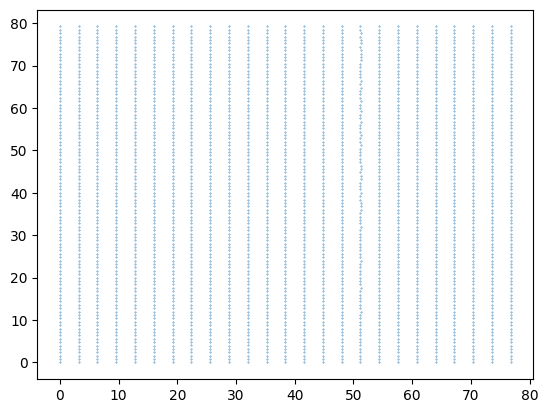

In [21]:
def test_x_0():
	x = cal_x_0(0, 80, 0, 80, 0.8)
	print(x.shape)
	plt.scatter(x[:, 0], x[:, 1], s=0.1)
	plt.show()
test_x_0()

#### Boundary handle
Define $x = (x^\chi, x^\gamma), v_i = (v^\chi, v^\gamma)$.

The liquid is only allowed to be in a small rect container in all time:

$$
x^\chi \in [x_{left}, x_{right}] \\
x^\gamma \in [x_{down}, x_{up}] \\
$$

We just explicitly adjust $x, v$ to meet the requirements above:

$$
\begin{aligned}
&\text{If } x^\chi < x_{left}: &
	x^\chi \leftarrow x_{left}, & \quad
	v^\chi \leftarrow \eta |v^\chi|
	\\
&\text{If } x^\chi > x_{right}: &
	x^\chi \leftarrow x_{right}, & \quad
	v^\chi \leftarrow - \eta |v^\chi|
	\\
&\text{If } x^\gamma < x_{down}: &
	x^\gamma \leftarrow x_{down}, & \quad
	v^\gamma \leftarrow \eta |v^\gamma|
	\\
&\text{If } x^\gamma > x_{up}: &
	x^\gamma \leftarrow x_{up}, & \quad
	v^\gamma \leftarrow - \eta |v^\gamma|
\end{aligned}
$$

where $\eta \in [0, 1]$ is a constant.

In [22]:
@ti.kernel
def kernel_boundary_handle(
	x: ti.types.ndarray(), 
	v: ti.types.ndarray(), 
	x_left: float, x_right: float, 
	x_down: float, x_up: float,
	eta: float,
):
	for i in range(x.shape[0]):
		if x[i, 0] < x_left:
			x[i, 0] = x_left
			v[i, 0] = eta * abs(v[i, 0])
		if x[i, 0] > x_right:
			x[i, 0] = x_right
			v[i, 0] = - eta * abs(v[i, 0])
		if x[i, 1] < x_down:
			x[i, 1] = x_down
			v[i, 1] = eta * abs(v[i, 1])
		if x[i, 1] > x_up:
			x[i, 1] = x_up
			v[i, 1] = - eta * abs(v[i, 1])

def boundary_handle(x, v, x_left, x_right, x_down, x_up, eta):
	x_ = x.clone()
	v_ = v.clone()
	kernel_boundary_handle(x_, v_, x_left, x_right, x_down, x_up, eta)
	return x_, v_

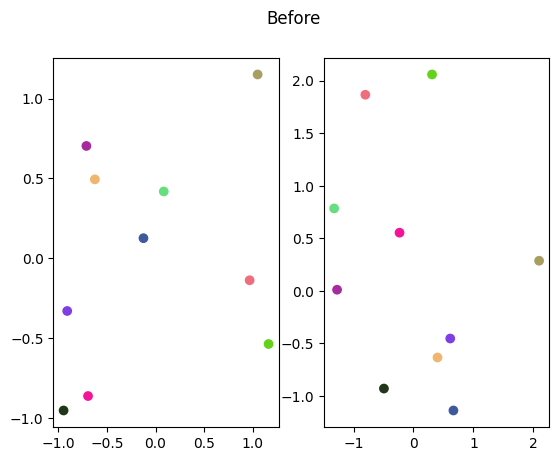

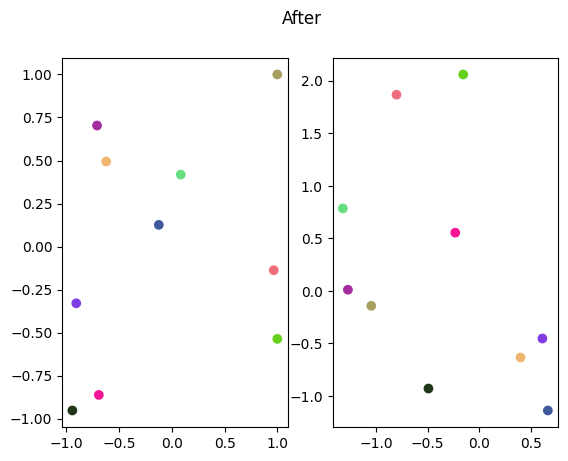

In [23]:
def test_boundary_handle():
	n = 10
	x = torch.empty((n, 2)).uniform_(-1.2, 1.2)
	v = torch.empty((n, 2)).normal_(0, 1.0)
	eta = 0.5

	colors = torch.rand((n, 3)).numpy()

	def PLOT(title):
		plt.subplot(121)
		plt.scatter(x[:, 0], x[:, 1], c=colors)
		plt.subplot(122)
		plt.scatter(v[:, 0], v[:, 1], c=colors)
		plt.suptitle(title)
		plt.show()

	PLOT("Before")
	x, v = boundary_handle(x, v, -1, 1, -1, 1, eta)
	PLOT("After")
test_boundary_handle()

#### External conditions
Mass $m$ and external acceleration $b$ are external conditions.

We just make them constant:

$$
m_i^t = \bar{m} \\
b_i^t = \bar{b} = (0, -g) \\
$$

where $g$ is gravity acceleration.

In [24]:
def cal_m(n, bar_m):
	return torch.empty((n)).fill_(bar_m)
def cal_b(n, g):
	b = torch.empty((n, 2))
	b[:, 0].zero_()
	b[:, 1].fill_(-g)
	return b

## Solve

In [25]:
torch.manual_seed(54891564)

#### Constants

In [26]:
frame_num = 600
h = 0.8
fps = 60
dt = 1.0/fps
bar_rho_0 = 1.0
bar_m = 0.01 * h * h * h
g = 0.1
kappa = 20
mu = 0.025

eta = 0.95
x_left =  0
x_right = 80
x_down = 0
x_up = 80

#### Init

In [27]:
x0 = cal_x_0(x_left, x_right, x_down, x_up, h)
n = x0.shape[0]

In [28]:
m = cal_m(n, bar_m)
b = cal_b(n, g)
rho_0 = cal_rho_0(n, bar_rho_0)

In [29]:
v0 = cal_v_0(n, dt, x_left, x_right, x_down, x_up)
colors = torch.rand((n, 3))

In [30]:
x = x0.clone()
v = v0.clone()

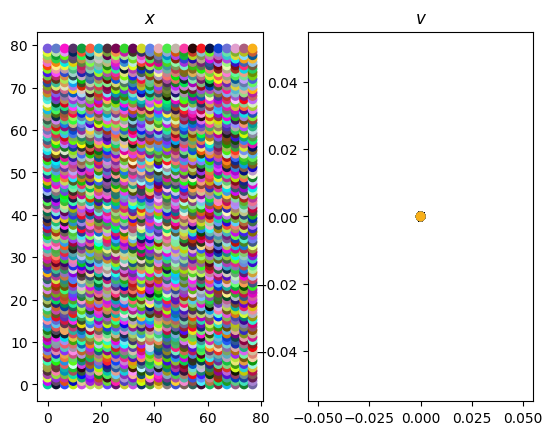

In [31]:
def PLOT():
	plt.subplot(121)
	plt.title("$x$")
	plt.scatter(x[:, 0], x[:, 1], c=colors)
	plt.subplot(122)
	plt.title("$v$")
	plt.scatter(v[:, 0], v[:, 1], c=colors)
	plt.show()
PLOT()

#### Tick

In [32]:
rho = torch.empty((n))
p = torch.empty((n))
grad_p = torch.empty((n, 2))
a = torch.empty((n, 2))
def tick():
	global x, v, rho, p, grad_p, a
	rho = cal_rho(m, x, h)
	p = cal_p(kappa, rho, rho_0)
	grad_p = cal_grad_p(p, m, rho, x, h)
	lap_v = cal_lap_v(m, v, rho, x, h)
	a = cal_a(grad_p, rho, mu, lap_v, b)
	v = v_explicit_euler(v, dt, a)
	x = x_implicit_euler(x, dt, v)
	x, v = boundary_handle(x, v, x_left, x_right, x_down, x_up, eta)

In [33]:
from timeline import Timeline

In [34]:
timeline = Timeline()
for i in range(frame_num):
	tick()
	timeline.memo(i, {
		"x": x,
		"v": v,
		"rho": rho,
		"p": p,
		"grad_p": grad_p,
		"a": a,
	})
timeline.tensoralize()

## Render

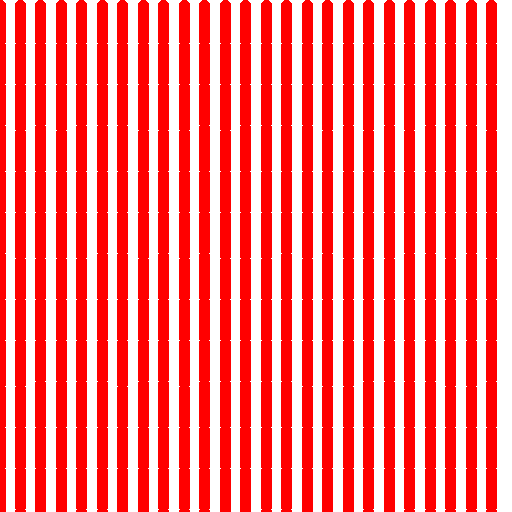

In [35]:

from render import PointRender2D, imgs2gif
render = PointRender2D()

imgs = []
for i in range(len(timeline["x"])):
	x = timeline["x"][i]
	imgs.append(render(
		centers = x,
		radius = 5.0,
		viewport = [x_left, x_down, x_right-x_left, x_up-x_down],
		height = 512, width = 512,
	))

img_path = imgs2gif(
	imgs=imgs,
	output_dir="./outputs/",
	filename="res.gif",
	framerate=fps,
)

from IPython.display import Image
Image(open(img_path, "rb").read())

## Analyze

In [36]:
test_i = 85
test_frame_begin = 0
test_frame_end = 100

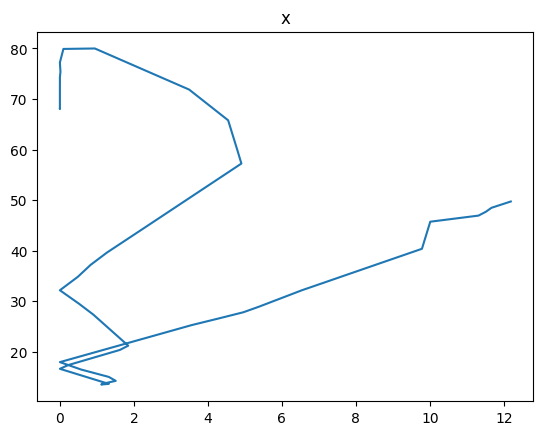

In [37]:
test_x = timeline["x"][test_frame_begin:test_frame_end, test_i]
plt.plot(test_x[:, 0], test_x[:, 1])
plt.title("x")
plt.show()

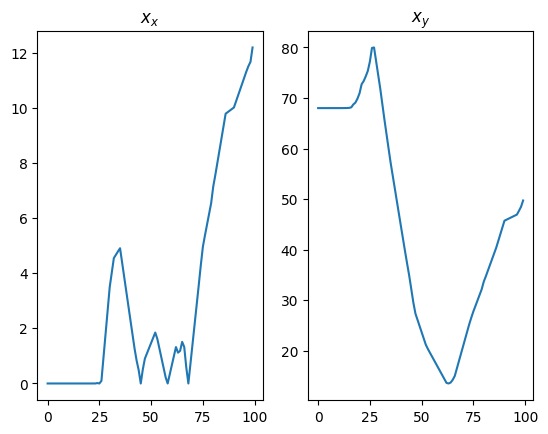

In [38]:
test_x = timeline["x"][test_frame_begin:test_frame_end, test_i]
plt.subplot(121)
plt.plot(test_x[:, 0])
plt.title("$x_x$")
plt.subplot(122)
plt.plot(test_x[:, 1])
plt.title("$x_y$")
plt.show()

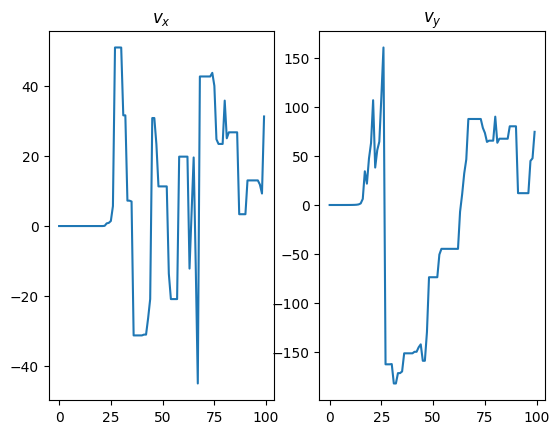

In [39]:
test_v = timeline["v"][test_frame_begin:test_frame_end, test_i]
plt.subplot(121)
plt.plot(test_v[:, 0])
plt.title("$v_x$")
plt.subplot(122)
plt.plot(test_v[:, 1])
plt.title("$v_y$")
plt.show()

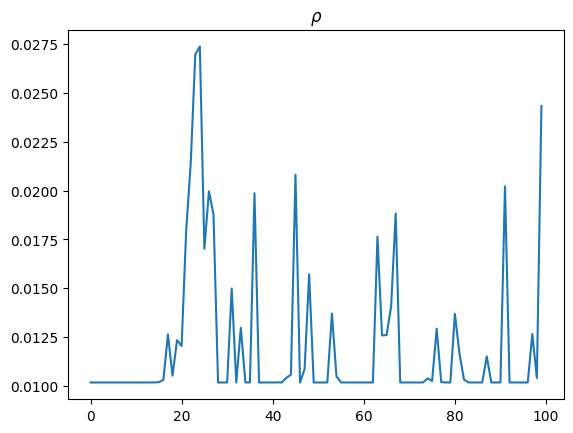

In [40]:
test_rho = timeline["rho"][test_frame_begin:test_frame_end, test_i]
plt.plot(test_rho)
plt.title(r"$\rho$")
plt.show()

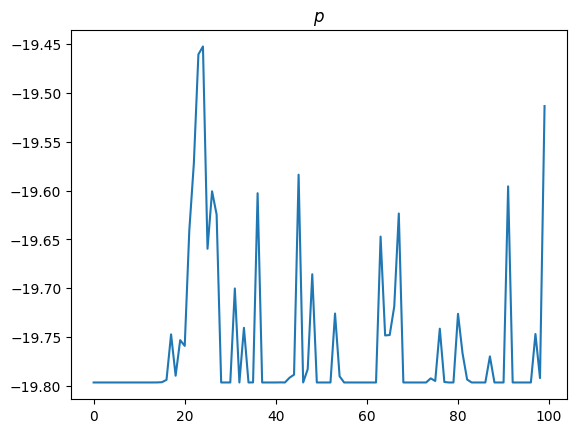

In [41]:
test_p = timeline["p"][test_frame_begin:test_frame_end, test_i]
plt.plot(test_p)
plt.title(r"$p$")
plt.show()

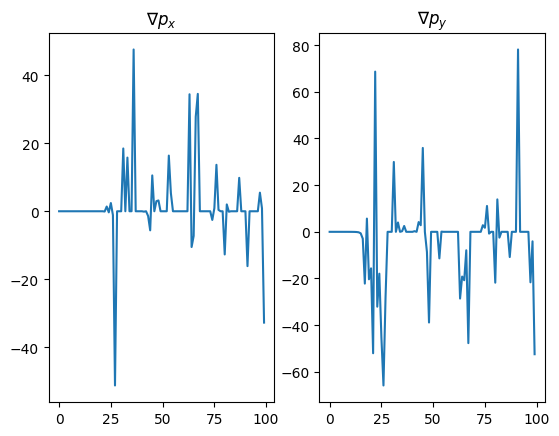

In [42]:
test_grad_p = timeline["grad_p"][test_frame_begin:test_frame_end, test_i]
plt.subplot(121)
plt.plot(test_grad_p[:, 0])
plt.title(r"$\nabla p_x$")
plt.subplot(122)
plt.plot(test_grad_p[:, 1])
plt.title(r"$\nabla p_y$")
plt.show()

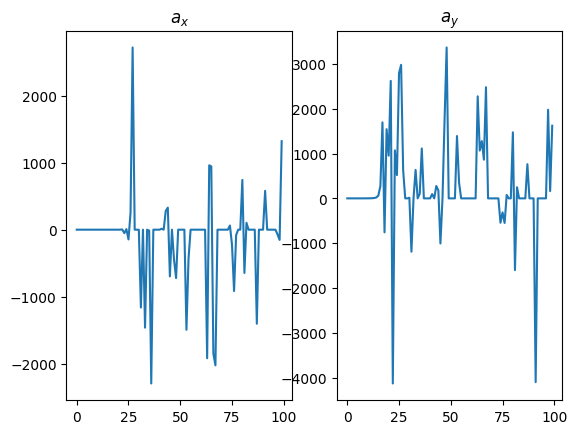

In [43]:
test_a = timeline["a"][test_frame_begin:test_frame_end, test_i]
plt.subplot(121)
plt.plot(test_a[:, 0])
plt.title(r"$a_x$")
plt.subplot(122)
plt.plot(test_a[:, 1])
plt.title(r"$a_y$")
plt.show()

In [44]:
def check_nan(key):
	print(f"Check if {key} is nan: {torch.any(torch.isnan(timeline[key])).cpu().numpy()}")
check_nan("x")
check_nan("v")
check_nan("rho")
check_nan("p")
check_nan("grad_p")
check_nan("a")

Check if x is nan: False
Check if v is nan: False
Check if rho is nan: False
Check if p is nan: False
Check if grad_p is nan: False
Check if a is nan: False
